In [1]:
!nvidia-smi

Wed Dec  6 16:53:42 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 546.01                 Driver Version: 546.01       CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3060      WDDM  | 00000000:01:00.0  On |                  N/A |
|  0%   37C    P8              11W / 170W |    628MiB / 12288MiB |      8%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
# !pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
# !pip install -qqq diffusers==0.24.0 
# !pip install -qqq transformers==4.35.2 
# !pip install -qqq accelerate==0.24.1 

In [2]:
import torch
from diffusers import AutoPipelineForText2Image

save_dir1 = "D:\StableDiffusion models\SDXL_weights"

# image_generator = AutoPipelineForText2Image.from_pretrained(
#     "stabilityai/sdxl-turbo", torch_dtype=torch.float16, variant="fp16" , force_download=True, resume_download=False
# ).to("cuda")
# image_generator.save_pretrained(save_dir)

image_generator = AutoPipelineForText2Image.from_pretrained(save_dir1, torch_dtype=torch.float16, variant="fp16").to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [4]:
# import torch
# from diffusers import AutoPipelineForImage2Image
# from diffusers.utils import load_image

# save_dir2 = "D:\StableDiffusion models\SDXL_weights_for_img2img_Pipeline"

# # image_generator = AutoPipelineForImage2Image.from_pretrained(
# #     "stabilityai/sdxl-turbo", torch_dtype=torch.float16, variant="fp16" , force_download=True, resume_download=False
# # ).to("cuda")
# # image_generator.save_pretrained(save_dir)

# image_generator = AutoPipelineForImage2Image.from_pretrained(save_dir2, torch_dtype=torch.float16, variant="fp16").to("cuda")

model_index.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [5]:
%%time

generator = torch.Generator(device="cuda").manual_seed(42)

prompt = """
Depict a beautiful snowy landscape with a large, transparent glass bottle as the central focus.
Inside the bottle, place a cute llama, creating a whimsical, surreal effect.
The background should feature a breathtaking, high-dynamic-range (HDR) sunrise,
illuminating the snowy scenery and enhancing the magical atmosphere.
""".strip()

outputs = image_generator(
    prompt=prompt, num_inference_steps=1, guidance_scale=0, generator=generator
)

  0%|          | 0/1 [00:00<?, ?it/s]

CPU times: total: 1.66 s
Wall time: 1.66 s


In [6]:
outputs.keys(), len(outputs.images)

(odict_keys(['images']), 1)

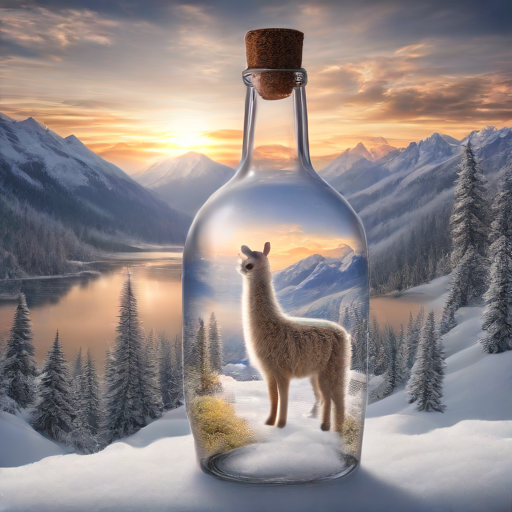

In [7]:
outputs.images[0]

In [8]:
images = []
for steps in range(1, 7):
    generator = torch.Generator(device="cuda").manual_seed(42)

    prompt = """
    Depict a beautiful snowy landscape with a large, transparent glass bottle as the central focus.
    Inside the bottle, place a cute llama, creating a whimsical, surreal effect.
    The background should feature a breathtaking, high-dynamic-range (HDR) sunrise,
    illuminating the snowy scenery and enhancing the magical atmosphere.
    """.strip()

    outputs = image_generator(
        prompt=prompt, num_inference_steps=steps, guidance_scale=0, generator=generator
    )
    images.append(outputs.images[0])

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

In [9]:
def display_image_grid(images, titles, grid_width, font, image_spacing=10):
    if len(images) != len(titles):
        raise ValueError("Number of images and titles must be the same")

    img_width, img_height = images[0].size

    n = len(images)
    grid_height = n // grid_width + (n % grid_width > 0)

    total_width = img_width * grid_width + image_spacing * (grid_width - 1)
    total_height = img_height * grid_height + image_spacing * (grid_height - 1)

    grid_image = Image.new("RGB", (total_width, total_height), (255, 255, 255))

    for i, (image, title) in enumerate(zip(images, titles)):
        row = i // grid_width
        col = i % grid_width
        x = col * (img_width + image_spacing)
        y = row * (img_height + image_spacing)

        draw = ImageDraw.Draw(image)
        text_bbox = draw.textbbox((0, 0), title, font=font)
        text_width = text_bbox[2] - text_bbox[0]
        text_height = text_bbox[3] - text_bbox[1]
        text_x = (img_width - text_width) // 2
        text_y = 0
        draw.text((text_x, text_y), title, font=font, fill=(255, 255, 255))

        grid_image.paste(image, (x, y))

    return grid_image

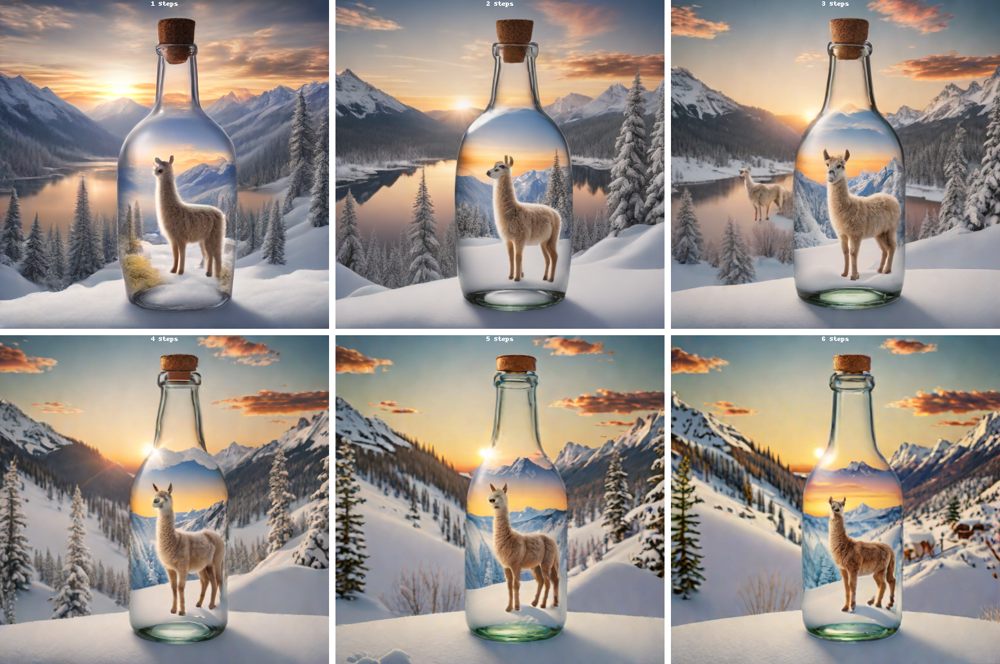

In [12]:
display_image_grid(
    images, titles=[f"{steps} Steps" for steps in range(1, 7)], grid_width=3, font=ImageFont.load_default()
)

In [13]:
images = []
for scale in range(6):
    generator = torch.Generator(device="cuda").manual_seed(42)

    prompt = """
    Depict a beautiful snowy landscape with a large, transparent glass bottle as the central focus.
    Inside the bottle, place a cute llama, creating a whimsical, surreal effect.
    The background should feature a breathtaking, high-dynamic-range (HDR) sunrise,
    illuminating the snowy scenery and enhancing the magical atmosphere.
    """.strip()

    outputs = image_generator(
        prompt=prompt,
        num_inference_steps=2,
        guidance_scale=float(scale),
        generator=generator,
    )
    images.append(outputs.images[0])

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

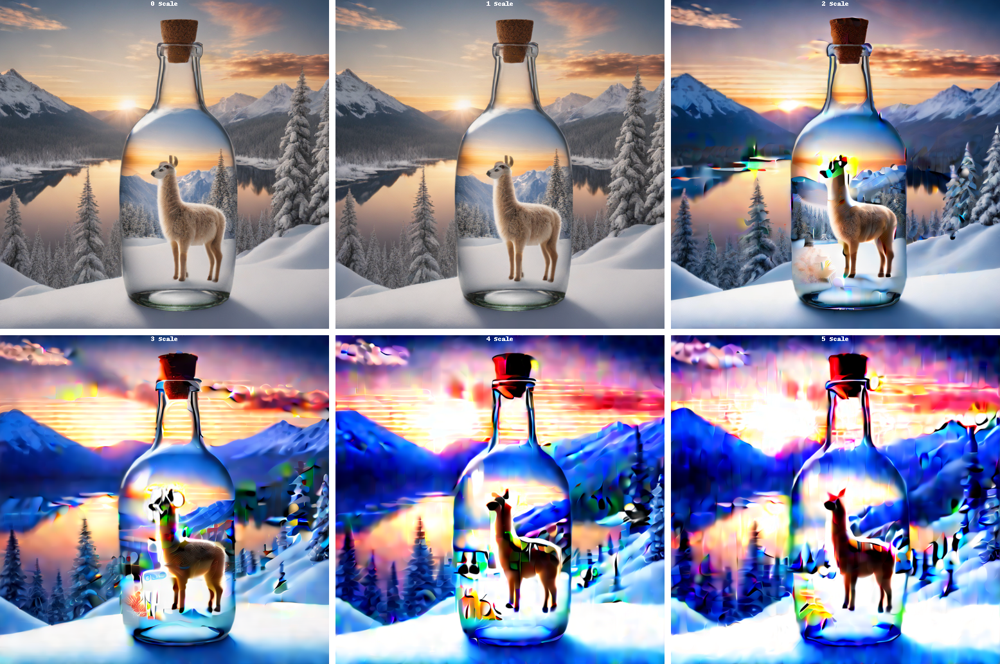

In [15]:
display_image_grid(
    images, titles=[f"{scale} Scale" for scale in range(6)], grid_width=3, font=ImageFont.load_default()
)

In [3]:
import torch


def generate_image(
    prompt, inference_steps: int = 2, guidance_scale: float = 0.0, seed: int = 42
):
    generator = torch.Generator(device="cuda").manual_seed(seed)
    outputs = image_generator(
        prompt=prompt,
        num_inference_steps=inference_steps,
        guidance_scale=guidance_scale,
        generator=generator,
    )

    return outputs.images[0]

## Animals and Wildlife

  0%|          | 0/4 [00:00<?, ?it/s]

CPU times: total: 797 ms
Wall time: 1.03 s


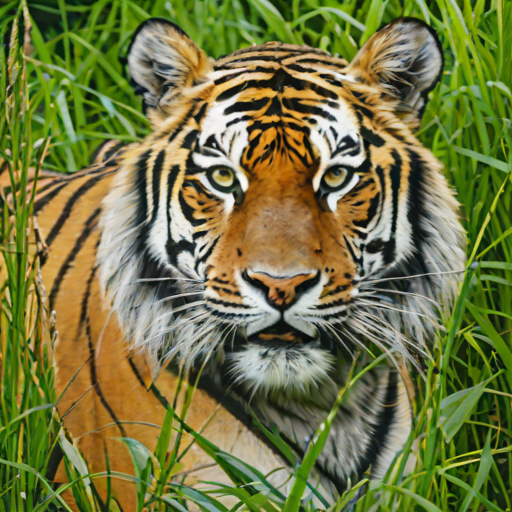

In [18]:
%%time
prompt = """
A hyper-realistic photograph of a majestic tiger, with striking blue eyes, moving gracefully through a field of tall grass.
The image captures the powerful essence and detailed fur texture of the tiger, set against the lush greenery of the grass.
""".strip()

generate_image(prompt, inference_steps=4)

  0%|          | 0/2 [00:00<?, ?it/s]

CPU times: total: 828 ms
Wall time: 891 ms


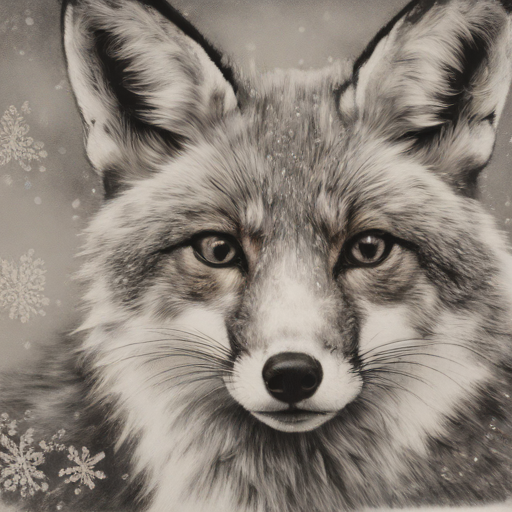

In [19]:
%%time
prompt = """
Generate a detailed charcoal drawing of a close-up portrait of a curious fox,
featuring snowflakes delicately resting on its fur, capturing the texture and
depth characteristic of charcoal art.
""".strip()

generate_image(prompt, inference_steps=2)

## Nature

  0%|          | 0/4 [00:00<?, ?it/s]

CPU times: total: 750 ms
Wall time: 1.07 s


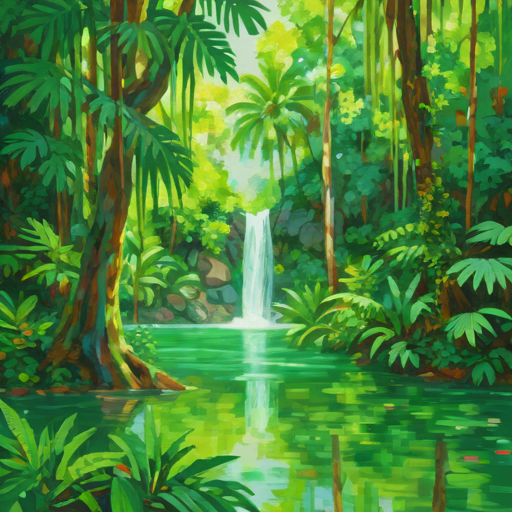

In [20]:
%%time

prompt = """
A peaceful and tranquil waterfall cascading down in a dense, vibrant tropical forest.
The forest is illuminated by gentle sunlight that filters through the thick canopy of green leaves,
creating a play of light and shadow on the forest floor and the water's surface.
The entire scene is depicted in an impressionistic style, reminiscent of Claude Monet's technique.
""".strip()

generate_image(prompt, inference_steps=4)

  0%|          | 0/4 [00:00<?, ?it/s]

CPU times: total: 891 ms
Wall time: 968 ms


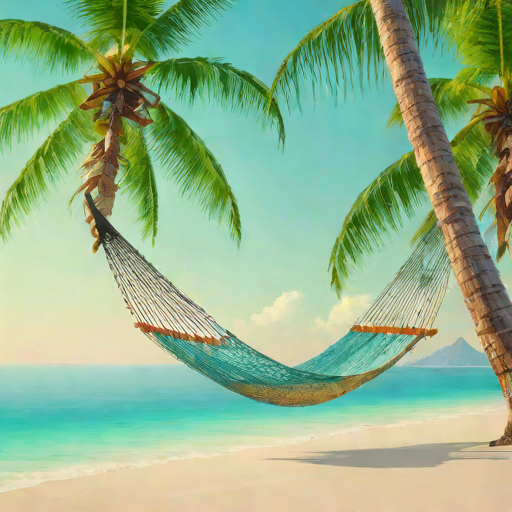

In [21]:
%%time

prompt = """
A serene beach landscape featuring a hammock strung between two palm trees,
facing a pristine, crystal-clear ocean. The scene should be rendered in a
vivid watercolor style, emphasizing soft and fluid color transitions,
capturing the essence of tranquility and natural beauty.
""".strip()

generate_image(prompt, inference_steps=4)

## Fantasy

  0%|          | 0/6 [00:00<?, ?it/s]

CPU times: total: 812 ms
Wall time: 1.29 s


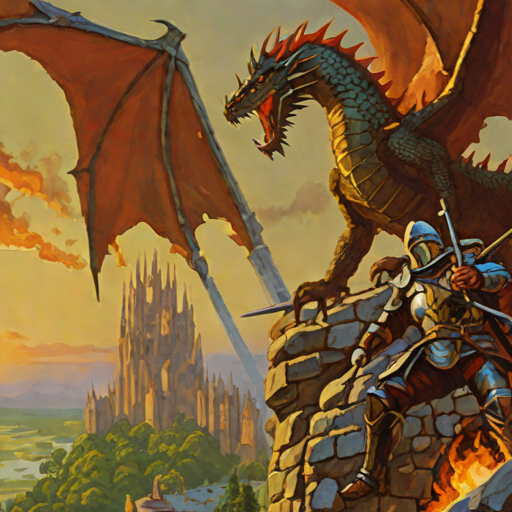

In [22]:
%%time

prompt = """
A dramatic scene atop a medieval castle tower: a knight in gleaming armor
battles a fierce, fire-breathing dragon. Emulate Frank Frazetta's dynamic,
vibrant style, highlighting the epic fantasy of the confrontation.
""".strip()

generate_image(prompt, inference_steps=6)

  0%|          | 0/2 [00:00<?, ?it/s]

CPU times: total: 562 ms
Wall time: 870 ms


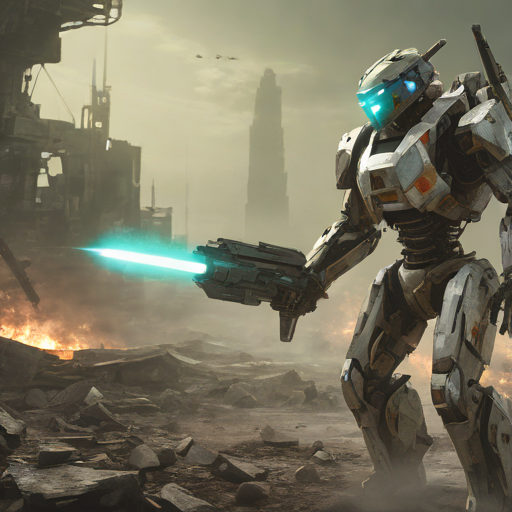

In [23]:
%%time

prompt = """
A futuristic robot warrior in a post-apocalyptic landscape, wielding a luminous energy weapon. The scene captures a detailed concept art style, evoking a high-tech, dystopian atmosphere.
""".strip()

generate_image(prompt, inference_steps=2)

## People

  0%|          | 0/2 [00:00<?, ?it/s]

CPU times: total: 625 ms
Wall time: 804 ms


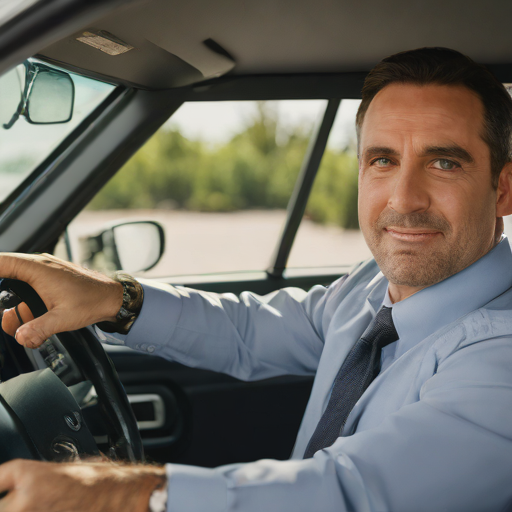

In [24]:
%%time

prompt = """
Michael G Scott (from the TV show The Office) inside his car, driving and smiling.
centered, looking into the camera, symmetrical body, symmetrical face, symmetrical eyes,
natural light photo, Canon 85L f4.8, ISO320, 5000K colour balance
""".strip()

generate_image(prompt, inference_steps=2)

Token indices sequence length is longer than the specified maximum sequence length for this model (78 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['production']
Token indices sequence length is longer than the specified maximum sequence length for this model (78 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['production']


  0%|          | 0/2 [00:00<?, ?it/s]

CPU times: total: 516 ms
Wall time: 859 ms


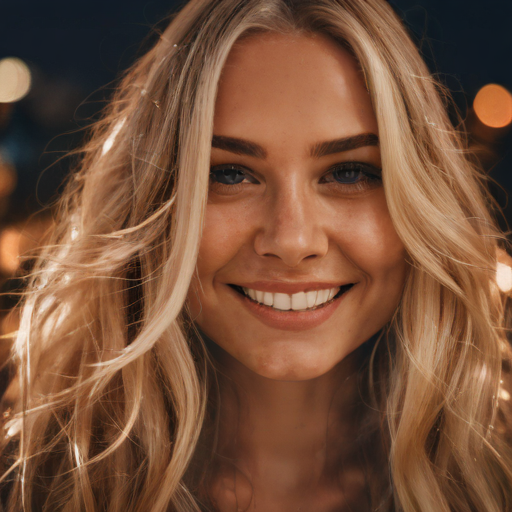

In [25]:
%%time

prompt = """
a smiling beautiful woman with long blonde hair and glossy eyes surrounded by glowing fire sparks at night,
symmetrical body, symmetrical face, symmetrical eyes,
magical light fog, deep focus+closeup, hyper-realistic,
volumetric lighting, dramatic lighting, beautiful composition,
intricate details, instagram, trending, photograph, film grain and noise, 8K,
cinematic, post-production
""".strip()

generate_image(prompt, inference_steps=2)

## Misc

  0%|          | 0/2 [00:00<?, ?it/s]

CPU times: total: 844 ms
Wall time: 883 ms


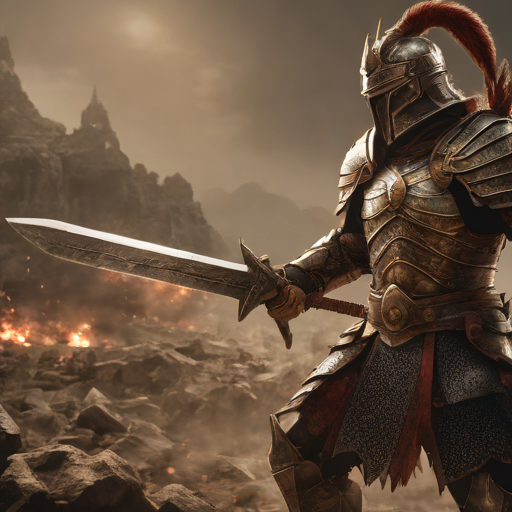

In [26]:
%%time

prompt = """
A vividly detailed digital artwork depicting a warrior in dramatic battle stance,
clad in unique armor and wielding a distinctive weapon,
set against an intense backdrop.
dramatic lighting, cinematic, post-production
""".strip()

generate_image(prompt, inference_steps=2)

  0%|          | 0/4 [00:00<?, ?it/s]

CPU times: total: 812 ms
Wall time: 1.03 s


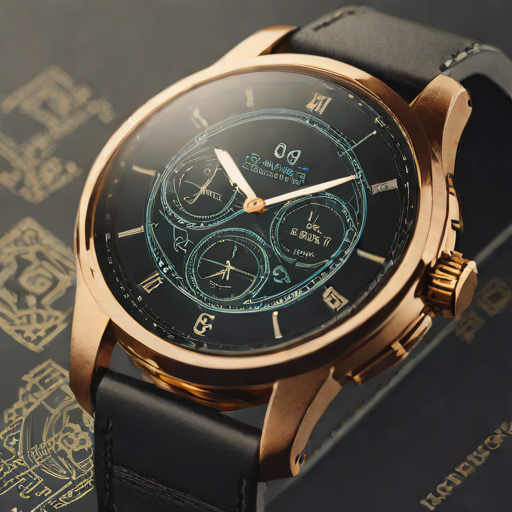

In [27]:
%%time

prompt = """
A concept image of a vintage-inspired smartwatch with a futuristic twist,
featuring a holographic display,
combining elements of classic elegance and advanced technology.
intricate details, instagram, trending, photograph, film grain and noise, 8K
""".strip()

generate_image(prompt, inference_steps=4)

## Negative Prompts

  0%|          | 0/2 [00:00<?, ?it/s]

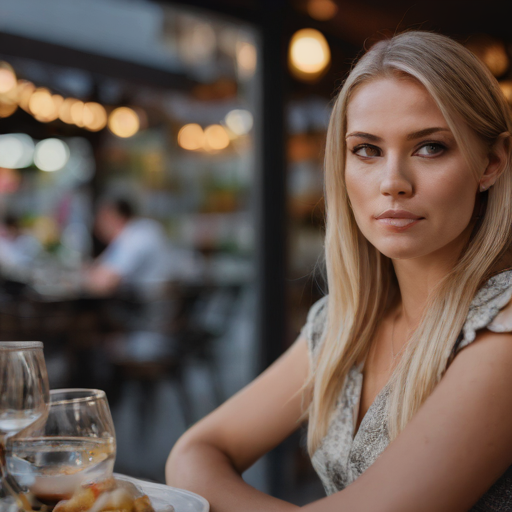

In [28]:
generator = torch.Generator(device="cuda").manual_seed(42)

prompt = """
An ultra-quality photograph of a young woman with highlighted hair, sitting outside a restaurant.
She wears a dress, with studio and rim lighting enhancing her features.
She looks directly at the camera, capturing a sharp focus, tack sharp details, and depth of field.
Fujifilm XT3. Her eyes are glossy and highly detailed, with skin showing clear pores
""".strip()

negative_prompt = """
disfigured, ugly, bad, immature, cartoon, anime, 3d, painting, b&w
""".strip()

image_generator(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=2,
    guidance_scale=0.0,
    generator=generator,
).images[0]

  0%|          | 0/2 [00:00<?, ?it/s]

CPU times: total: 609 ms
Wall time: 798 ms


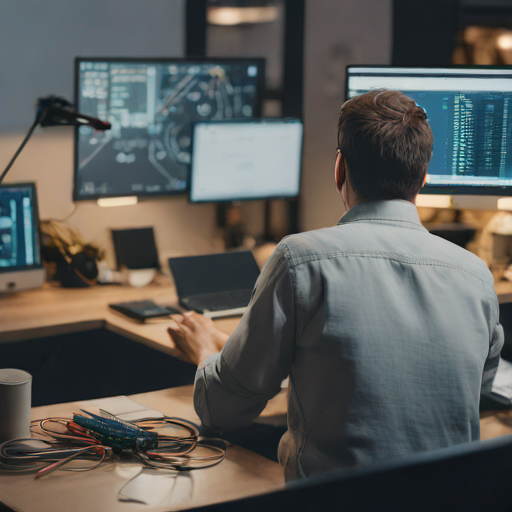

In [88]:
%%time

prompt = """
An ultra-quality photograph of a Developer on his working table working very hard, from back view show programming stuff on his table.
""".strip()

negative_prompt = """
disfigured, ugly, bad, immature, cartoon, anime, 3d, painting, b&w, ugly face, disalignment, face blur, wrongface
""".strip()

image_generator(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=2,
    guidance_scale=0.0,
    generator=generator,
).images[0]

  0%|          | 0/2 [00:00<?, ?it/s]

CPU times: total: 672 ms
Wall time: 783 ms


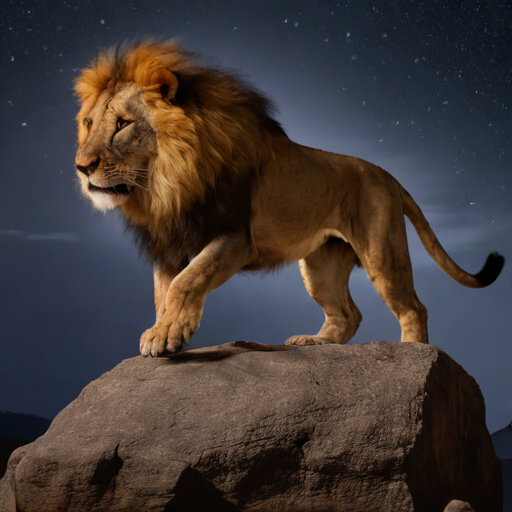

In [8]:
%%time

generator = torch.Generator(device="cuda").manual_seed(5)

prompt = """
A majestic lion jumping from a big stone at night
""".strip()


image_generator(
    prompt=prompt,
    num_inference_steps=2,
    guidance_scale=0.0,
    generator=generator,
).images[0]

In [1]:
from diffusers import DiffusionPipeline
import torch

# load both base & refiner
base = DiffusionPipeline.from_pretrained(
    "D:\StableDiffusion models\SDXL_Base_model", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
base.to("cuda")
refiner = DiffusionPipeline.from_pretrained(
    "D:\StableDiffusion models\SDXL_Refiner_model",
    text_encoder_2=base.text_encoder_2,
    vae=base.vae,
    torch_dtype=torch.float16,
    use_safetensors=True,
    variant="fp16",
)
refiner.to("cuda")

# Define how many steps and what % of steps to be run on each experts (80/20) here
n_steps = 40
high_noise_frac = 0.8

prompt = """An ultra-quality photograph of a young woman with highlighted hair, sitting outside a restaurant.
She wears a dress, with studio and rim lighting enhancing her features.
She looks directly at the camera, capturing a sharp focus, tack sharp details, and depth of field.
Fujifilm XT3. Her eyes are glossy and highly detailed, with skin showing clear pores
""".strip()

# run both experts
image = base(
    prompt=prompt,
    num_inference_steps=n_steps,
    denoising_end=high_noise_frac,
    output_type="latent",
).images
image = refiner(
    prompt=prompt,
    num_inference_steps=n_steps,
    denoising_start=high_noise_frac,
    image=image,
).images[0]


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

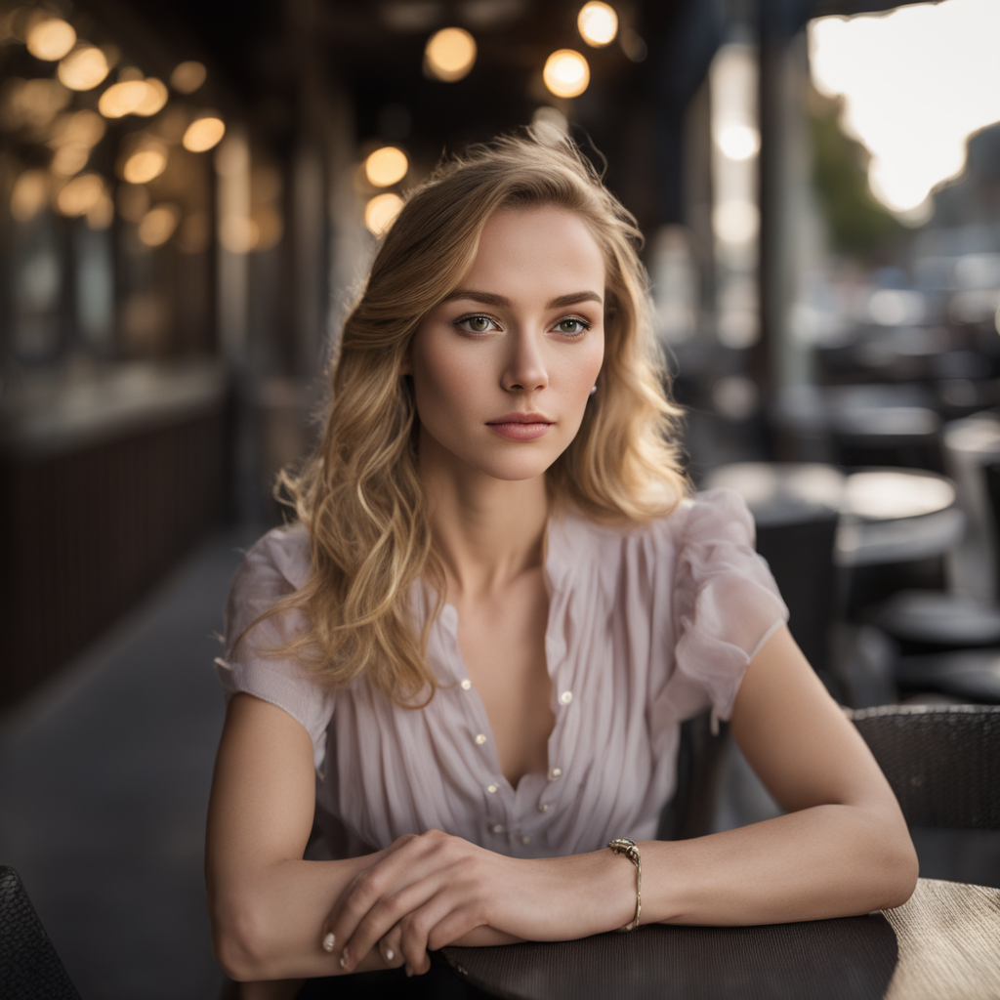

In [2]:
from PIL import Image
image

In [3]:
# base.save_pretrained("D:\StableDiffusion models\SDXL_Base_model")
# refiner.save_pretrained("D:\StableDiffusion models\SDXL_Refiner_model")